# View Cell Neighborhood using Alphashape
Data is obtained from 10X Genomics

In [14]:
%load_ext autoreload
%autoreload 2
%env ANYWIDGET_HMR=1

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
env: ANYWIDGET_HMR=1


In [51]:
import os
import matplotlib.pyplot as plt
import pandas as pd
import geopandas as gpd
import celldega as dega
from celldega.pre import _to_geometry
from spatialdata_io import xenium
import spatialdata as sd
import scanpy as sc
import pandas as pd
import squidpy as sq
from shapely.geometry import Point
import json

def plot_alpha_shapes(gdf_alpha, alpha_value, transparency=0.2, subset_view=False):
    fig, ax = plt.subplots(figsize=(20,8))
    gdf_alpha.loc[gdf_alpha['inv_alpha']==alpha_value].plot(ax=ax, aspect=1, column='cat', legend=True, cmap='gist_ncar', alpha=transparency)
    ax.invert_yaxis()
    plt.title(f"Neighborhood (alphashape)")
    plt.tight_layout()
    plt.xlabel('x (micron)')
    plt.ylabel('y (micron)')
    if subset_view:
        plt.xlim(1000, 3000)
        plt.ylim(1400, 2500)
    plt.show()


# Data initialization

In [16]:
# dataset_name = 'Xenium_Prime_Ovarian_Cancer_FFPE_XRrun_outs'
dataset_name = 'Xenium_V1_human_Pancreas_FFPE_outs'
tech = 'Xenium'
DATA_DIR = f'data/raw'
data_dir = f'{DATA_DIR}/{dataset_name}'
path_landscape_files = f'data/landscape_files/{dataset_name}'

# Load h5ad file
adata = sc.read_h5ad(f'{data_dir}.h5ad')
adata.obs.set_index('cell_id', inplace=True)

# Option 1: Create alphashapes from raw dataset

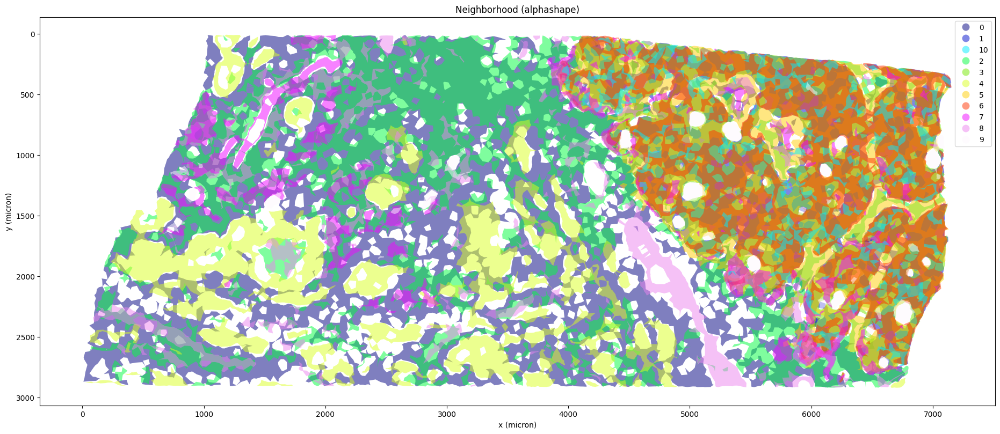

In [ ]:
# Derive the cell metadata
df_cell = gpd.GeoDataFrame(
    data={
        'cluster': adata.obs['leiden'],
        'x': adata.obsm['spatial'][:, 0],
        'y': adata.obsm['spatial'][:, 1],
    },
)
conversion_factor = 0.21250001593750117

# Calculate alpha shapes in micron space
df_cell['geometry'] = df_cell.apply(lambda row: [round(row['x'],3), round(row['y'], 3)], axis=1)
alphas_list = [100, 150, 200, 250, 300, 350]
alphas_list = [int(x * conversion_factor) for x in alphas_list]
gdf_alpha = dega.nbhd.alpha_shape_cell_clusters(df_cell, cat='cluster', alphas=alphas_list)

# Convert to pixel space
gdf_alpha_pixel = dega.pre.coordinate_transform(gdf_alpha, path_landscape_files, "micron_to_pixel")

# Plot
plot_alpha_shapes(gdf_alpha, alphas_list[1], transparency=0.5, subset_view=False)

# Option 2: Create alphashapes from Landscape files

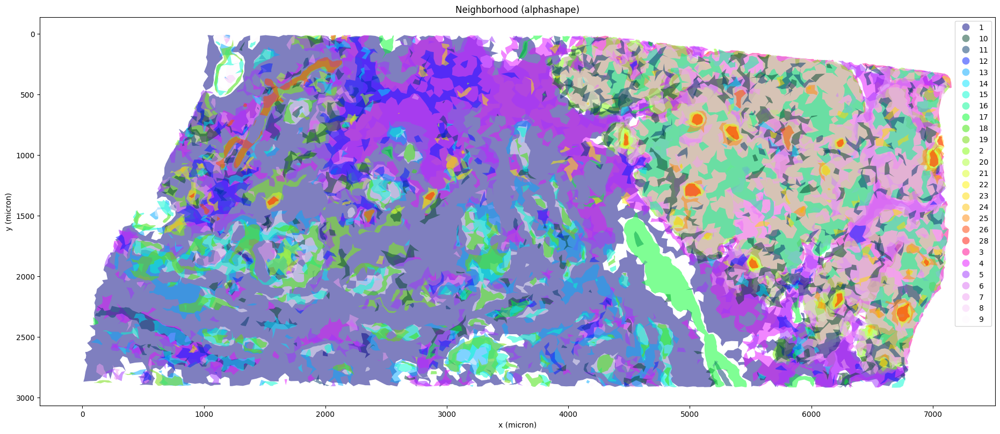

In [ ]:
meta_cell_ini = pd.read_parquet(f'{path_landscape_files}/cell_metadata.parquet')
cluster = pd.read_parquet(f'{path_landscape_files}/cell_clusters/cluster.parquet')
meta_cluster = pd.read_parquet(f'{path_landscape_files}/cell_clusters/meta_cluster.parquet')
meta_cell = meta_cell_ini.copy()
meta_cell['cluster'] = meta_cell['name'].map(cluster['cluster'])

# Calculate alpha shape
gdf_alpha_pixel = dega.nbhd.alpha_shape_cell_clusters(meta_cell, cat='cluster', alphas=[100, 150, 200, 250, 300, 350])

# Convert to micron space
gdf_alpha_micron = dega.pre.coordinate_transform(gdf_alpha_pixel, path_landscape_files, "pixel_to_micron")

# Plot
plot_alpha_shapes(gdf_alpha_micron, alpha_value=150, transparency=0.5, subset_view=False)

# Save alphashpae

In [30]:
if not os.path.exists(f'{path_landscape_files}/spatial_regions'):
    os.makedirs(f'{path_landscape_files}/spatial_regions') # nbhd

gdf_alpha_pixel.to_parquet(f'{path_landscape_files}/spatial_regions/alphasahpe_region_pixel.parquet', index=False)
gdf_alpha_micron.to_parquet(f'{path_landscape_files}/spatial_regions/alphasahpe_region_micron.parquet', index=False)